In [2]:
using Pkg
Pkg.activate("../scripts/calval")
# Pkg.update(; name="IceFloeTracker", rev="main")
using IceFloeTracker
using Images
using Random
using DataFrames
using StatsBase

include("../scripts/dev/segmentation.jl")

  Activating project at `~/Documents/research/calval_tgrs/scripts/calval`


_remove_labels! (generic function with 1 method)

In [7]:
using NCDatasets

ds = NCDataset("../data/case_studies/beaufort_sea-large.250m.2008-06-08.aqua.nc");

# Extract the true color and false color images
tc_img_data = ds["modis_truecolor"][:,:,:] ./ 255;
fc_img_data = ds["modis_falsecolor"][:,:,:] ./ 255;

# Need to reformat it to an image
tc_img = colorview(RGBA, [transpose(tc_img_data[:, :, i]) for i in 1:4]...);
fc_img = colorview(RGBA, [transpose(fc_img_data[:, :, i]) for i in 1:4]...);

In [4]:
# import the Beaufort Sea image and crop
#  tc_img = load("../data/beaufort_sea-large.250m.2008-06-25.terra.tiff")

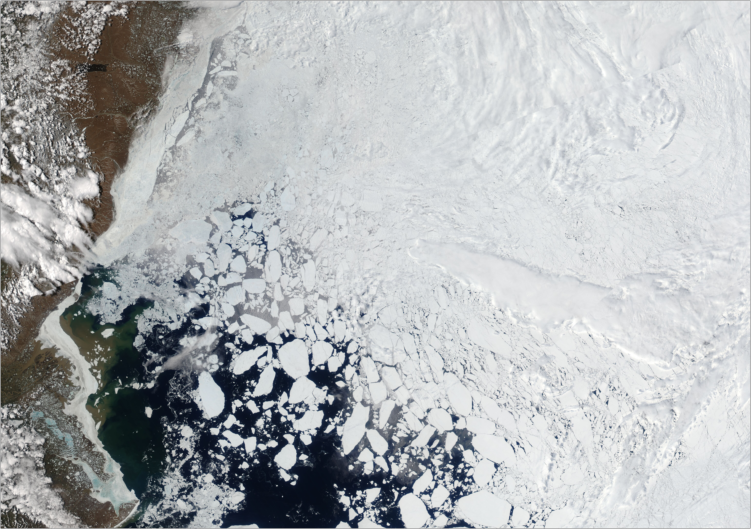

In [8]:
tc_img

In [5]:
size(tc_img)

(4224, 6000)

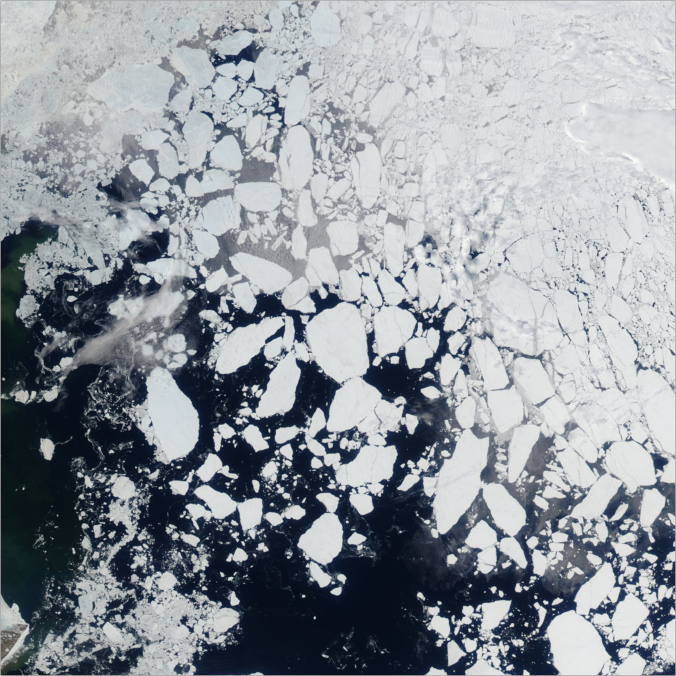

In [6]:
# Square image, 2700 by 2700 pixels
zoom = (1500:4199, 1000:3699)
tc_img = tc_img[zoom...]

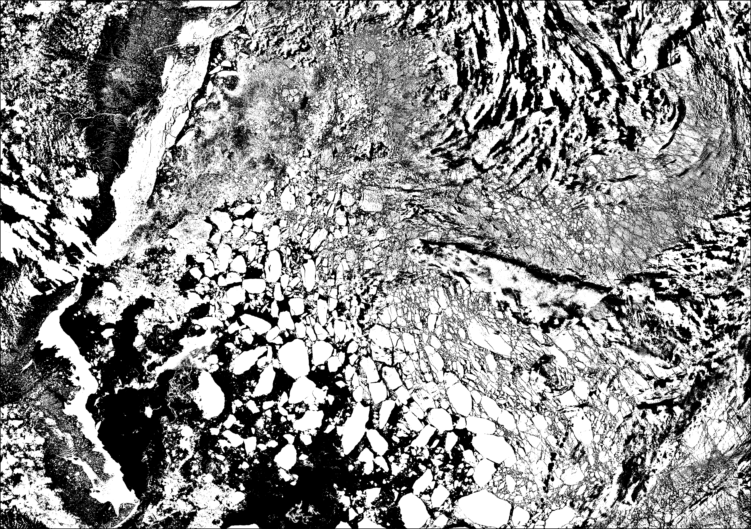

In [9]:
binary_img = binarize(Gray.(red.(tc_img)), AdaptiveThreshold(;window_size=400, percentage=0))

The binarized result already looks pretty good! However, we know that there is a lot of noise in the image, and we need to separate some objects. To visualize this, we will label components, and remove the components that are below 100 pixels in size.


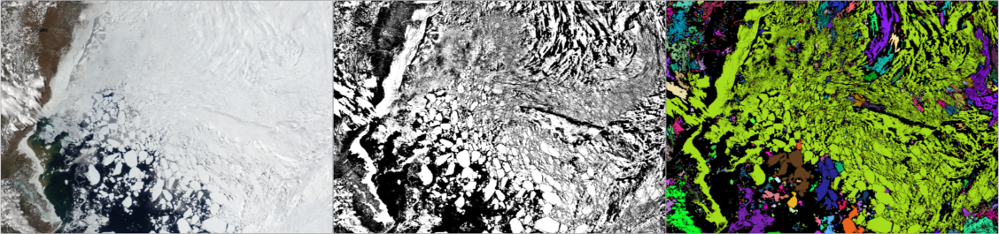

In [10]:
labeled_img = label_components(binary_img .> 0)
remove_small_segments!(labeled_img, 100)
mosaicview(tc_img, binary_img, view_seg_random(SegmentedImage(tc_img, labeled_img)), npad=10, fillvalue=RGBA(0,0,0,0), nrow=1)

Next, we'll retrieve all the levels of the dist morph split routine for visualization. We'll need to modify the code to do that.

In [12]:
function dist_morph_split_breakdown(
    binary_floes::BitMatrix;
    max_hole_fill::Int64=2000,
    max_depth::Int64=25,
    max_depth_ratio::Real=0.7,
    max_expand::Int64=2,
    opening_strel=strel_disk(5),
)
    dist = distance_transform(feature_transform(.!binary_floes))
    # Initialize with one run of opening
    levels = Dict(0 => label_components(opening(dist .> 0, opening_strel)))

    ### Build pyramid - each size is the opened and filled thresholded image for a given distance
    for dist_threshold in 1:max_depth
        markers = opening(dist .> dist_threshold, opening_strel)
        markers .= .!imfill(.!markers, (0, max_hole_fill))
        labeled_markers = label_components(markers)
        maximum(labeled_markers) == 0 && break

        labels = filter(r -> r != 0, unique(labeled_markers))
        indices = component_indices(labeled_markers)
        
        # check 1: Remove components with no intersection with the layer below
        remove_list = _nonoverlapping_labels(levels[dist_threshold - 1], indices, labels)
        _remove_labels!(labeled_markers, indices, remove_list)
        filter!(r -> r ∉ remove_list, labels)

        # check 2: Remove components which fail the max_depth_ratio to component maximum depth test
        maximum_depths = Dict(L => maximum(dist[indices[L]]) for L in labels)
        remove_list = [L for L ∈ labels if max_depth_ratio * maximum_depths[L] < dist_threshold]
        _remove_labels!(labeled_markers, indices, remove_list)
        levels[dist_threshold] = labeled_markers
    end
    max_depth = maximum([d for d in keys(levels)])
    final_labels = copy(levels[max_depth])
    levels_init = deepcopy(levels)
    
    ### Descend pyramid
    for dist_threshold in max_depth:-1:1
        # Get indices from level d-1
        indices = component_indices(levels[dist_threshold - 1])
        labels = filter(r -> r != 0, unique(levels[dist_threshold - 1]))
        # Expand indices at level d
        expanded = expand_labels(levels[dist_threshold], max_expand)
        for L in labels
            matched_labels = unique(levels[dist_threshold][indices[L]])
            # If intersection of the label at level
            if (0 ∈ matched_labels) && (length(matched_labels) <= 2)
                final_labels[indices[L]] .= L
                continue
            end
            # Otherwise, expand the current level, and set the next level down to the expanded indices.
            # May need to check the number of matched labels in the expanded image.
            levels[dist_threshold - 1][indices[L]] .= expanded[indices[L]]
            final_labels[indices[L]] .= expanded[indices[L]]
        end
    end
    return levels_init, levels, label_components(final_labels)
end

dist_morph_split_breakdown (generic function with 1 method)

In [13]:
@time begin
    levels_init, levels, final = dist_morph_split_breakdown(labeled_img .> 0; max_depth_ratio=0.5); 
end

 97.553891 seconds (6.11 M allocations: 81.475 GiB, 5.14% gc time, 1.36% compilation time)


(Dict(5 => [1 1 … 0 0; 1 1 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 16 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 20 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 12 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 24 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 8 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 17 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 1 => [1 1 … 0 0; 1 1 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 19 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 0 => [1 1 … 0 0; 1 1 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0]…), Dict(5 => [1 1 … 0 0; 1 1 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 16 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 20 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 12 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 24 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 8 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 17 => [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], 1 => [1 1 … 0 0; 1 1 … 0 0; … ; 0 0 … 0 0

In [14]:
imgs = [
    RGB.(levels_init[k] .> 0) for k in 5:5:25
]
nothing

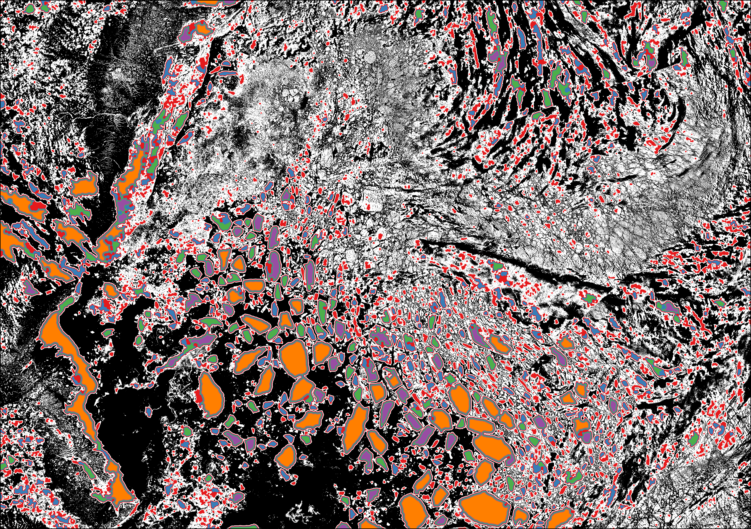

In [15]:
# Color stack from ColorBrewer
# Blue-green ramp
colors = [
    RGB(([240,249,232] ./ 255)...),
    RGB(([186,228,188] ./ 255)...),
    RGB(([123,204,196] ./ 255)...),
    RGB(([67,162,202] ./ 255)...),
    RGB(([8,104,172] ./ 255)...)
    ]

colors = [
    RGB(([228,26,28] ./ 255)...),
    RGB(([55,126,184] ./ 255)...),
    RGB(([77,175,74] ./ 255)...),
    RGB(([152,78,163] ./ 255)...),
    RGB(([255,127,0] ./ 255)...)
    ]

img_stack = RGB.(binary_img)
for idx in 1:5
    imgs[idx][Gray.(imgs[idx]) .> 0] .= colors[idx]
    img_stack[Gray.(imgs[idx]) .> 0] .= colors[idx]
end
img_stack

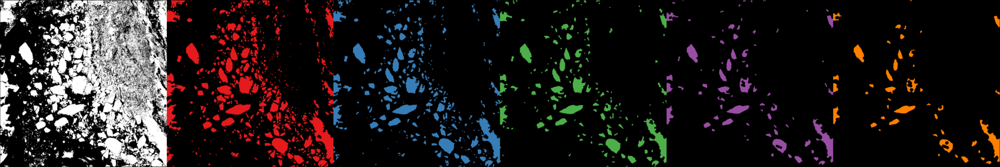

In [55]:
mosaicview(hcat(binary_img, imgs...), nrow=1)

In [ ]:
5:5:25

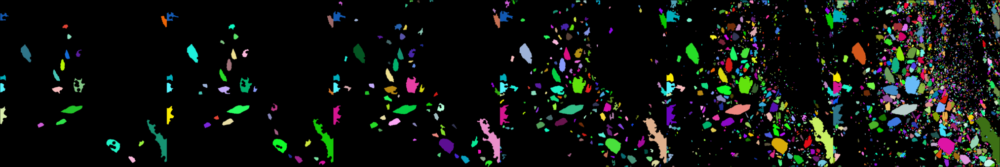

In [69]:
labeled_levels = [
    view_seg_random(SegmentedImage(tc_img, levels[d]))
    for d in 25:-5:5
    ]
mosaicview(hcat(labeled_levels..., view_seg_random(SegmentedImage(tc_img, final))), nrow=1)

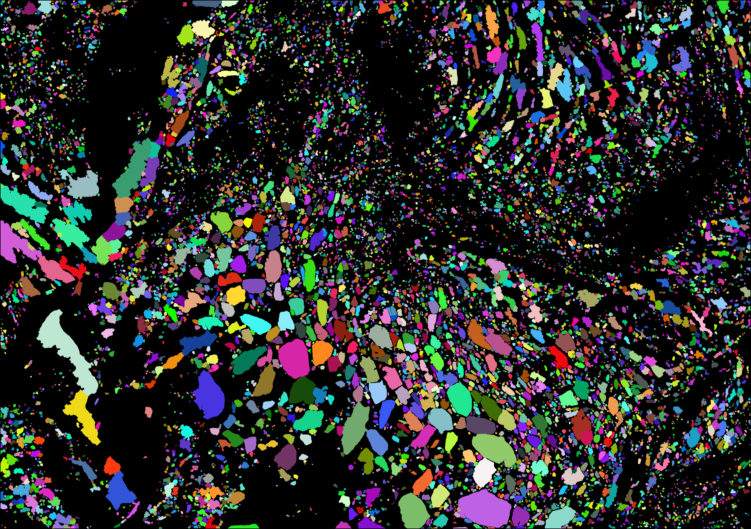

In [16]:
cview = view_seg_random(SegmentedImage(tc_img, label_components(final .% 40)))

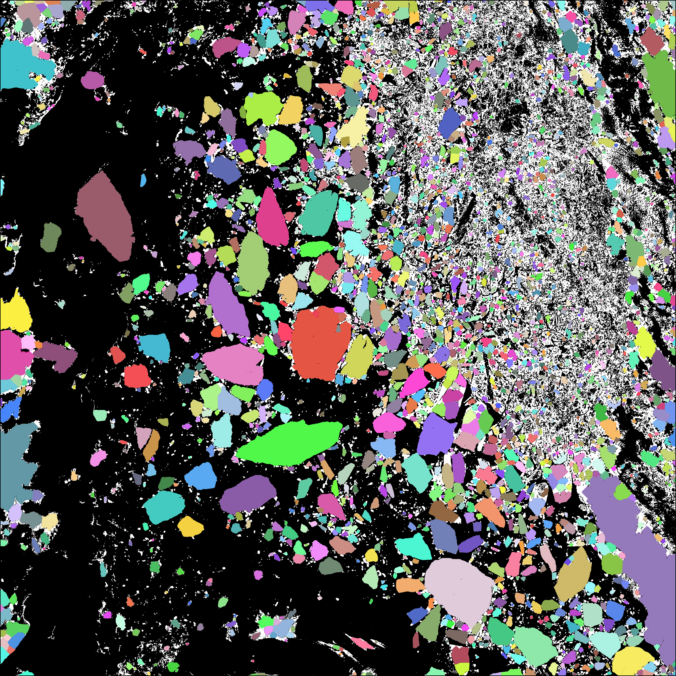

In [62]:
overlay = RGB.(binary_img)
overlay[final .> 0] .= 0.25 .* overlay[final .> 0] .+ 0.75 .* cview[final .> 0]
overlay

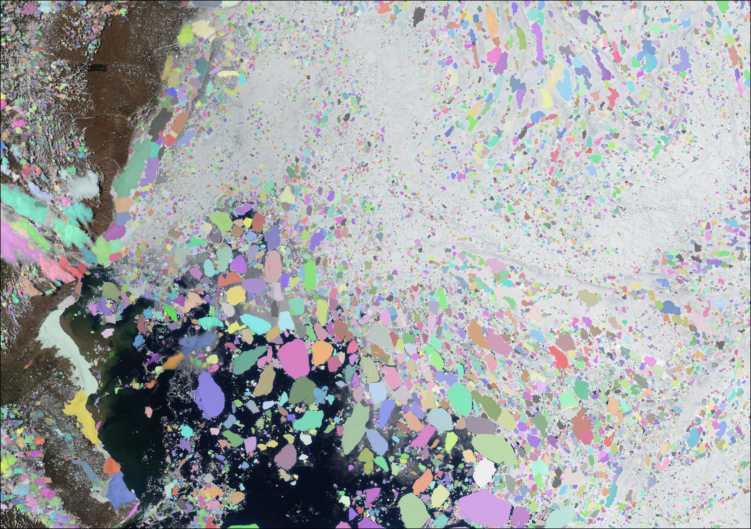

In [17]:
overlay = RGB.(tc_img)
overlay[final .> 0] .= 0.5 .* overlay[final .> 0] .+ 0.5 .* cview[final .> 0]
# mosaicview(img_stack, overlay, nrow=1, fillvalue=RGBA(0,0,0,0), npad=10)
overlay

# Testing the dist-morph-split method
1. Select case with labeled floes
2. Dilate floes

In [3]:
dataset = Watkins2026Dataset(; ref="v0.2")
case = first(filter(c -> (c.case_number == 6 && c.satellite == "terra"), dataset))

Case(GitHubLoader("https://github.com/danielmwatkins/ice-floe-validation-dataset", "v0.2", "/tmp/Watkins2026"), DataFrameRow
 Row │        case_number  region      satellite  start_date  pass_time        ⋯
     │ Int64  Int64        String      String     Dates.Date  DateTime         ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │    10            6  baffin_bay  terra      2022-05-30  2022-05-30T16:44 ⋯
                                                              21 columns omitted)

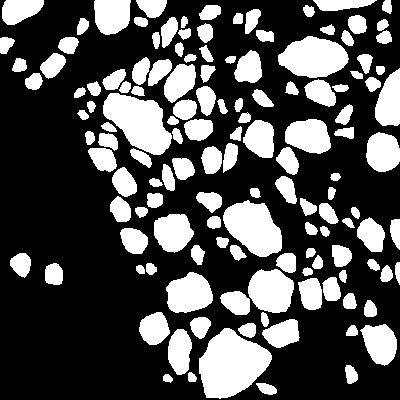

In [14]:
binary_floes = validated_binary_floes(case)

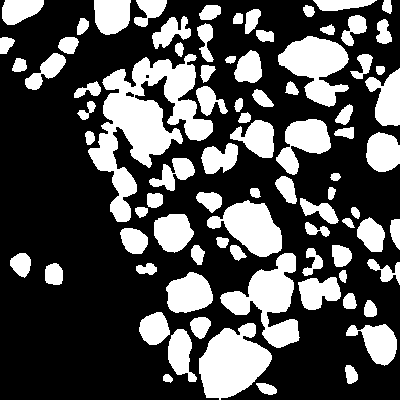

In [148]:
dataset = Watkins2026Dataset(; ref="v0.2")
case = first(filter(c -> (c.case_number == 63 && c.satellite == "terra"), dataset))
binary_floes = validated_binary_floes(case)
se = strel_box((3,3))
dilated_floes = erode(dilate(binary_floes, se), se)
split_floes = dist_morph_split(dilated_floes .> 0; 
    max_hole_fill=50,
    max_depth_ratio=0.7,
    max_depth=25,
    opening_strel=strel_disk(2));
la_split_floes = LopezAcosta2019.morph_split_floes(dilated_floes .> 0, falses(size(dilated_floes .> 0)));

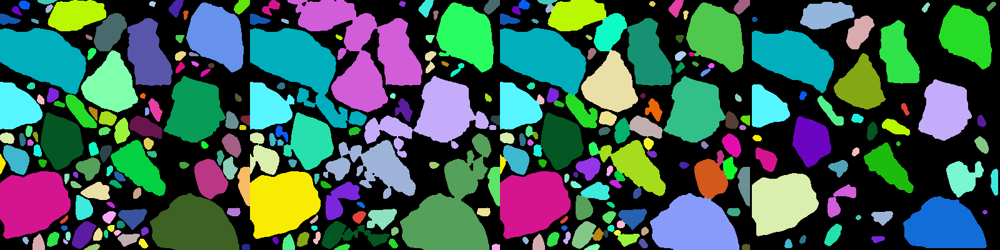

In [149]:
vsr(r) = view_seg_random(SegmentedImage(Gray.(r .> 0), r))
mosaicview(
    vsr(label_components(binary_floes)),
    vsr(label_components(dilated_floes)),
    vsr(split_floes),
    vsr(label_components(la_split_floes)), nrow=1)

In [150]:
labeled_floes = label_components(binary_floes)

function get_relevant_set(labels1, labels2)
    df1 = regionprops_table(labels1; properties=[:label, :area, :bbox, :centroid])
    df2 = regionprops_table(labels2; properties=[:label, :area, :bbox, :centroid])
    return get_relevant_set(df1, df2, labels1, labels2)
end

R = get_relevant_set(labeled_floes, split_floes);

# Fraction of original floes in at least one relevant set:
n = length(unique(labeled_floes)) - 1
println("Fraction Recovered: ", round((length(unique(split_floes)) - 1) / n, digits=3))

# Area difference
g_areas = component_lengths(labeled_floes)
s_areas = component_lengths(split_floes)
area_relative_error = DataFrame(g_label=Int64[], area=Int64[], relative_error=Float64[])
for k in keys(R)
    if length(R[k]) > 0
        for j in R[k]
            push!(area_relative_error, [Int64(k), g_areas[k], (g_areas[k] - s_areas[j]) / g_areas[k]])
        end
    end
end

print("Median error: ", round(median(abs.(area_relative_error.relative_error)), digits=3), "\n", 
    "Mean error: ", round(mean(abs.(area_relative_error.relative_error)), digits=3))

Fraction Recovered: 0.96
Median error: 0.022
Mean error: 0.303

In [92]:
mse = sqrt(mean(area_relative_error[:, :relative_error].^2))

1.1770506830743983

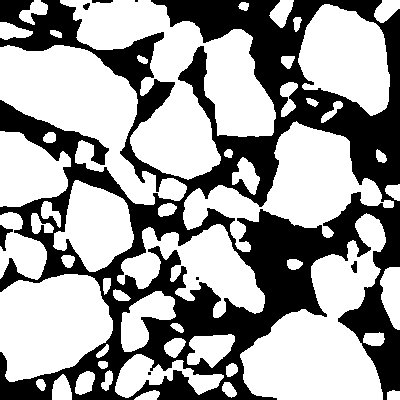

In [156]:
test = dilated_floes .> 0
dilated_floes

In [197]:
init_img

400×400 Matrix{Int64}:
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  54  54  54  54  54  54  54  54  54
 0  0  0  0  0  0  0  0  0  0  0  0  0     54  54  54  54  54  54  54  54  54
 0  0  0  0  0  0  0  0  0  0  0  0  0     54  54  54  54  54  54  54  54  54
 0  0  0  0  0  0  0  0  0  0  0  0  0     54  54  54  54  54  54  54  54  54
 0  0  0  0  0  0  0  0  0  0  0  0  0     54  54  54  54  54  54  54  54  54
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  54  54  54  54  54  54  54  54  54
 0  0  0  0  0  0  0  0  0  0  0  0  0     54  54  54  54  54  54  54  54  54
 0  0  0  0  0  0  0  0  0  0  0  0  0     54  54  54  54  54  54  54  54  54
 0  0  0  0  0  0  0  0  0  0  0  0  0     54  54  54  54  54  54  54  54  54
 0  0  0  0  0  0  0  0  0  0  0  0  0     54  54  54  54  54  54  54   0   0
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  54  54  54  54  54  54   0   0   0
 0  0  0  0  0  0  0  0  0  0  0  0  0     54  54  54  54  54   0   0   0   0
 0  0  0  0  0  0  0  0  0  0  0  0  0   